In [2]:
import bokeh
from bokeh.charts import Scatter, output_file, show
from bokeh.io import output_notebook
from bokeh.plotting import figure,show
from bokeh.resources import CDN
from bokeh.embed import file_html
output_notebook()

import sys
sys.path.append('/Users/jaredlorince/Downloads/tsne_python/')
import tsne
import numpy as np
import pandas as pd
from sklearn.manifold import MDS
from scipy.spatial.distance import pdist,squareform
from sklearn.metrics.pairwise import pairwise_distances
from urllib import unquote_plus
#from matplotlib import pyplot as plt
#%matplotlib inline

from seaborn import color_palette
colors = color_palette()

Loading BokehJS ...

In [5]:
#features = np.load("../GenreModeling/data/features/lda_artists/features_190.npy")
#model = MDS(n_components=2,dissimilarity='precomputed',n_jobs=-1,n_init=10,metric=False)
vocab_idx = {}
for line in open('../GenreModeling/data/vocab_idx'):
    line = line.strip().split('\t')
    #vocab_idx[int(line[1])] = unquote_plus(line[0]).title()
    vocab_idx[int(line[1])] = line[0]
#np.save('Y_data.npy',Y)
#Y = np.load('Y_data_5000.npy')    

#distances = squareform(pdist(features[:N],metric='cosine'))
#distances = pairwise_distances(features[:N],metric='cosine',n_jobs=2)
#coords = model.fit_transform(distances)

In [283]:
# features = np.load("../GenreModeling/data/features/lda_artists/features_190.npy")[:5000]
# max_iter=1000
# Y = tsne.tsne(features, 2, 50, 20.0);
# np.save('Y_data_5000.npy',Y)
from sklearn.manifold import TSNE
from scipy.spatial.distance import cosine
model = TSNE(n_components=2,metric=lambda x,y: max(0.,cosine(x,y)), init='pca')
Y = model.fit_transform(features[:5000])

KeyboardInterrupt: 

In [ ]:
Y.shape

In [55]:
test = Y[:3000]
p = figure(plot_width=800, plot_height=800)

# add a circle renderer with a size, color, and alpha
p.circle(test[:,0],test[:,1], size=5, color="red", alpha=0.8)
for i,(x,y) in enumerate(test):
    p.text(x,y,text=[unquote_plus(vocab_idx[i])],alpha=0.1)
show(p)

In [52]:
html = file_html(p, CDN, "artist space - top 3000 artists")

In [53]:
with open('/Users/jaredlorince/Downloads/test_3000.html','w') as f:
    f.write(html)

In [225]:
# gn_data = pd.read_table('/Users/jaredlorince/Dropbox/gracenote_song_data')
# artist_data = gn_data.groupby('gn_artist').apply(lambda df: df.iloc[0])
genre_data = artist_data[['genre1','genre2','genre3']].reindex(pd.Series(vocab_idx.values())).reset_index()
genre_data.to_csv("/Users/jaredlorince/git/MusicForaging/GenreModeling/data/gracenote_genre_data.csv",index=False)

NameError: name 'artist_data' is not defined

In [3]:
genre_data = pd.read_csv("/Users/jaredlorince/git/MusicForaging/GenreModeling/data/gracenote_genre_data.csv")
import scipy.io as sio
Y = sio.loadmat('/Users/jaredlorince/Downloads/tSNE_matlab/result_10000.mat')['result']

In [6]:

test = Y#[:1000]
genre_level='1'
genres = genre_data['genre'+genre_level].unique()


def get_color(genre):
    if genre is np.nan or genre=='other':
        genre = 'other/unknown'
    color = color_dict[genre]
    return genre,color

color_dict = dict(zip(['rock', 'alternative & punk', 'pop', 'electronica', 'urban',
       'traditional', 'soundtrack', 'jazz', 'classical'],['#%02x%02x%02x' % (a, b, c) for a,b,c in np.round(255*np.array(color_palette("Set1",n_colors=9))).astype(int)]))
color_dict['other/unknown'] = '#000000'
colors = [get_color(g)[1] for g in genre_data['genre1'].values[:len(test)]]

raw_source = pd.DataFrame(dict(
    x=test[:,0],
    y=test[:,1],
    label=[unquote_plus(vocab_idx[i]) for i in range(len(test))],
    color=colors,
    genre = [get_color(g)[0] for g in genre_data['genre1'].values[:len(test)]]))

raw_source.head()

,color,genre,label,x,y
0,#e41a1c,rock,the beatles,-29.578122,3.014788
1,#377eb8,alternative & punk,radiohead,-6.838255,1.687610
2,#377eb8,alternative & punk,muse,-4.468484,1.172417
3,#e41a1c,rock,pink floyd,-28.370972,4.859935
4,#e41a1c,rock,metallica,-30.800634,18.685001


In [7]:
bokeh.plotting.curdoc().clear()
from bokeh.models import Circle,BoxSelectTool, BoxZoomTool, LassoSelectTool,Text,HoverTool
from bokeh.plotting import ColumnDataSource
from collections import OrderedDict




#source = ColumnDataSource(

TOOLS="box_zoom,pan,reset,box_select,wheel_zoom,help,hover"
p = figure(plot_width=600, plot_height=600,tools=TOOLS)#,x_range=(-10,10))

for genre in raw_source['genre'].unique():
    source = ColumnDataSource(raw_source[raw_source['genre']==genre])
    p.circle(x='x',y='y',size=8,source=source,color='color',selection_color='color',nonselection_color='color',alpha=0.5,legend=genre)
    p.text(x='x',y='y',text='label',source=source,alpha=0.,selection_text_alpha=.55,nonselection_text_alpha=0.)
#renderer = p.circle(x=test[:,0],y=test[:,1],color=colors,size=8)#,selection_color=colors,nonselection_color=colors,alpha=0.75)

#renderer2 = 
hover = p.select(dict(type=HoverTool))
hover.tooltips = '@label'

p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.yaxis.visible = None
p.xaxis.visible = None




show(p)


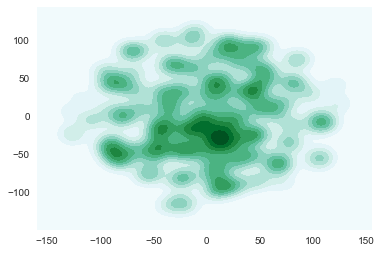

In [22]:
import seaborn
#seaborn.jointplot(x=Y[:,0],y=Y[:,1],kind='kdeplot')
ax = seaborn.kdeplot(data=Y[:,0],data2=Y[:,1],shade=True)
# ax.set_xlim(-5,5)
# ax.set_ylim(-10,10)

In [179]:
html = file_html(p, CDN, "artist space - top 2000 artists")
with open('/Users/jaredlorince/Downloads/test_2000.html','w') as f:
    f.write(html)

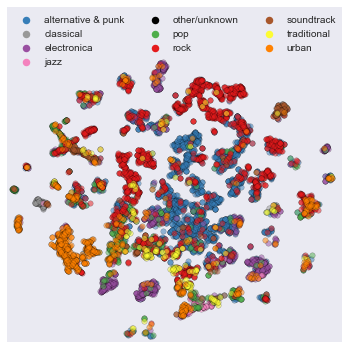

In [30]:
from matplotlib import pyplot as plt
%matplotlib inline

test = Y
genre_data = genre_data[:len(test)]


def get_color(genre):
    if genre is np.nan or genre=='other':
        genre = 'other/unknown'
    color = color_dict[genre]
    return genre,color

#color_dict = dict(zip(['rock', 'alternative & punk', 'pop', 'electronica', 'urban',
#       'traditional', 'soundtrack', 'jazz', 'classical'],['#%02x%02x%02x' % (a, b, c) for a,b,c in np.array(color_palette("Set1",n_colors=9))]))
color_dict = dict(zip(['rock', 'alternative & punk', 'pop', 'electronica', 'urban',
       'traditional', 'soundtrack', 'jazz', 'classical'],['#%02x%02x%02x' % (a, b, c) for a,b,c in np.round(255*np.array(color_palette("Set1",n_colors=9))).astype(int)]))
color_dict['other/unknown'] = '#000000'
#color_dict['other'] = (0.,0.,0.)
#color_dict[np.nan] = (0.,0.,0.)
colors = np.array([get_color(g)[1] for g in genre_data['genre1'].values[:len(test)]])


fig,ax = plt.subplots(1,1,figsize=(6,6))
for g in sorted(color_dict.keys()):
    if g == 'other/unkonwn':
        indices = genre_data[(genre_data['genre1'].isin([np.nan,'other','unknown']))]['genre1'].index.values
    else:
        indices = genre_data[genre_data['genre1']==g]['genre1'].index.values
    ax.scatter(test[indices,0],test[indices,1],c=color_dict[g],s=30,alpha=0.5)
    legend_line_1 = ax.plot(np.NaN, np.NaN, marker = '.', ls='',ms=15, label=g, c=color_dict[g])

ax.grid()
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xlim(-135,135)
ax.set_ylim(-125,165)
#ax.legend(bbox_to_anchor=(1.35,1))
# handles, labels = ax.get_legend_handles_labels()
# for h in handles:
#     h.set_alpha(1.)
#legend = ax.legend(handles,labels,loc='upper left',ncol=3)#,fancybox=True,framealpha=0.5,frameon=True)
ax.legend(loc='upper left',ncol=3)
#legend.get_frame().set_color('gray')


fig.savefig('/Users/jaredlorince/Desktop/test.pdf',bbox_inches='tight')

In [25]:
h.set_alpha(1)

NameError: name 'result' is not defined